In [19]:
!pip install pytorch-lightning -q
!pip install pytorch-lightning-bolts -q

In [20]:
'''
! pip install -q kaggle
from google.colab import files
files.upload()
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json
!kaggle datasets download -d splcher/animefacedataset
!unzip -qq ./animefacedataset.zip
'''
path = '/content/images'

In [21]:
import torch
from torch import nn
from torch.utils.data import DataLoader, Dataset
from torchvision import datasets, transforms
from torchvision.utils import make_grid
from torch.optim import Adam
from tqdm.notebook import tqdm
from glob import glob
import matplotlib.pyplot as plt
import pytorch_lightning as pl

In [22]:
def show_tensor_images(image_tensor, num_images=25, size=(3, 64, 64), ret=False):

    image_tensor = (image_tensor + 1) / 2
    image_unflat = image_tensor.detach().cpu()
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    if ret:
        return image_grid.permute(1, 2, 0).squeeze()
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

In [23]:
# Configurations are from DCGAN paper
z_dim = 100
batch_size = 128
lr = 0.0002

beta_1 = 0.5
beta_2 = 0.999

display_step = 500
device = 'cuda'

In [24]:
from PIL import Image

In [25]:
transform = transforms.Compose([
    transforms.Resize(64),
    transforms.CenterCrop(64),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
])

In [26]:

class ImageDataset(Dataset):
    def __init__(self, path, transform=None):
        self.transform = transform
        self.files = glob(f'{path}/*')

    def __len__(self):
        return len(self.files)

    def __getitem__(self, idx):
        file = self.files[idx]
        label = file.split('/')[-1]
        image = Image.open(file)
        if self.transform:
            image = self.transform(image)
        return image, label


ds = ImageDataset(path, transform=transform)
dataloader = dl = DataLoader(ds, batch_size=batch_size, shuffle=True)

In [28]:
def get_noise(cur_batch_size, z_dim, device):
    noise = torch.randn(cur_batch_size, z_dim, 1, 1, device=device)
    return noise

In [29]:
class Generator(nn.Module):
    def __init__(self, in_channels=3, z_dim=100):
        super(Generator, self).__init__()

        self.gen = nn.Sequential(
            self.create_upblock(z_dim, 1024, kernel_size=4, stride=1, padding=0),
            self.create_upblock(1024, 512, kernel_size=4, stride=2, padding=1),
            self.create_upblock(512, 256, kernel_size=4, stride=2, padding=1),
            self.create_upblock(256, 128, kernel_size=4, stride=2, padding=1),
            self.create_upblock(128, 3, kernel_size=4, stride=2, padding=1, final_layer=True),
        )

    def create_upblock(self, in_channels, out_channels, kernel_size=5, stride=2, padding=1, final_layer=False):
        if final_layer:
            return nn.Sequential(
                nn.ConvTranspose2d(in_channels, out_channels, kernel_size, stride, padding, bias=False),
                nn.BatchNorm2d(out_channels),
                nn.Tanh()
                )
        return nn.Sequential(
            nn.ConvTranspose2d(in_channels, out_channels, kernel_size, stride, padding, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(True))

    def forward(self, noise):
        assert len(noise.shape) == 4, 'random vector of shape=(N, 100, 1, 1)'

        return self.gen(noise)

In [30]:
class Discriminator(nn.Module):
    def __init__(self, im_chan=3, hidden_dim=32):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            self.make_disc_block(im_chan, hidden_dim),
            self.make_disc_block(hidden_dim, hidden_dim * 2),
            self.make_disc_block(hidden_dim * 2, hidden_dim * 4, stride=1),
            self.make_disc_block(hidden_dim * 4, hidden_dim * 4, stride=2),
            self.make_disc_block(hidden_dim * 4, 1, final_layer=True),
        )

    def make_disc_block(self, input_channels, output_channels, kernel_size=4, stride=2, final_layer=False):
        if not final_layer:
            return nn.Sequential(
                nn.Conv2d(input_channels, output_channels, kernel_size, stride), 
                nn.BatchNorm2d(output_channels),
                nn.LeakyReLU(0.2))
        else:
            return nn.Sequential(
                nn.Conv2d(input_channels, output_channels, kernel_size, stride))

    def forward(self, image):
        disc_pred = self.disc(image)
        return disc_pred.view(len(disc_pred), -1)

In [31]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [32]:
criterion = nn.BCEWithLogitsLoss()

In [33]:
class GAN(pl.LightningModule):
    def __init__(self,
                 learning_rate,
                 in_channels=3,
                 hidden_dim=32,
                 z_dim=100,
                 **kwargs):
        super().__init__()

        self.z_dim = z_dim
        self.learning_rate = learning_rate

        self.gen = Generator(in_channels, z_dim=z_dim).to(device)
        self.disc = Discriminator(im_chan=in_channels, hidden_dim=hidden_dim).to(device)

        self.gen.apply(weights_init)
        self.disc.apply(weights_init)

        self.save_hyperparameters()

    def forward(self, noise):
        return self.gen(noise)

    def disc_step(self, x, noise):
        fake_images = self.gen(noise)
        real_logits = self.disc(x)
        fake_logits = self.disc(fake_images.detach())
        assert real_logits.shape == fake_logits.shape, f"Real and fake logit shape are different: {real_logits.shape} and {fake_logits.shape}"
        real_loss = criterion(real_logits, torch.ones_like(real_logits))
        fake_loss = criterion(fake_logits, torch.zeros_like(fake_logits))
        disc_loss = (fake_loss + real_loss) / 2
        assert disc_loss is not None
        self.log('disc_loss', disc_loss, on_epoch=True, prog_bar=True)
        return disc_loss

    def gen_step(self, x, noise):
        fake_images = self.gen(noise)
        fake_logits = self.disc(fake_images)
        fake_loss = criterion(fake_logits, torch.ones_like(fake_logits))
        gen_loss = fake_loss
        assert gen_loss is not None
        self.log('gen_loss', gen_loss, on_epoch=True, prog_bar=True)
        return gen_loss

    def training_step(self, batch, batch_idx, optimizer_idx):
        x, _ = batch
        x = real = x.to(device)
        noise = get_noise(real.shape[0], self.z_dim, device=device)
        assert real.shape[1:] == (3, 64, 64), f"batch image data shape is incorrect: {real.shape}"

        if batch_idx % display_step == 0 and optimizer_idx == 0:
            fake_images = self.forward(noise)
            show_tensor_images(fake_images)

        loss = None
        if optimizer_idx == 0:
            loss = self.gen_step(real, noise)

        if optimizer_idx == 1:
            loss = self.disc_step(real, noise)
        return loss

    def configure_optimizers(self):
        lr = self.hparams.learning_rate

        opt_g = torch.optim.Adam(self.gen.parameters(),
                                 lr=lr,
                                 betas=(beta_1, beta_2))
        opt_d = torch.optim.Adam(self.disc.parameters(),
                                 lr=lr,
                                 betas=(beta_1, beta_2))
        return [opt_g, opt_d]

In [34]:
model = GAN(learning_rate=lr, z_dim=z_dim)
trainer = pl.Trainer(max_epochs=100, gpus=1)

GPU available: True, used: True
TPU available: False, using: 0 TPU cores


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name | Type          | Params
---------------------------------------
0 | gen  | Generator     | 12.7 M
1 | disc | Discriminator | 430 K 
---------------------------------------
13.1 M    Trainable params
0         Non-trainable params
13.1 M    Total params
52.356    Total estimated model params size (MB)


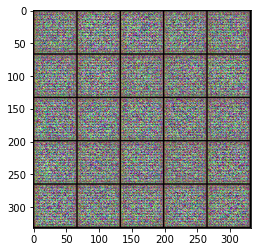

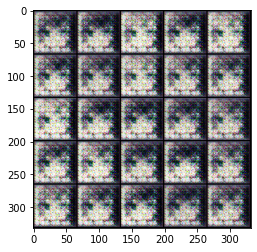

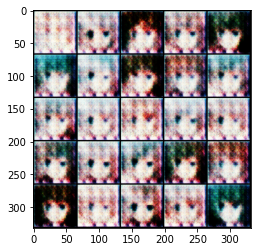

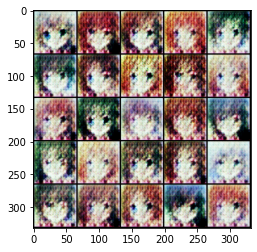

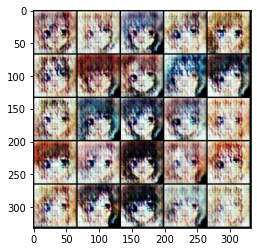

...

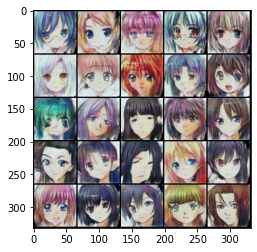

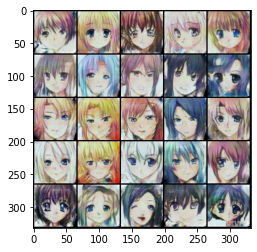

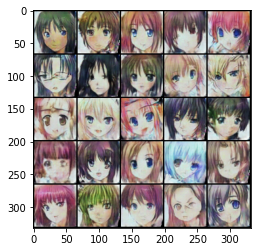

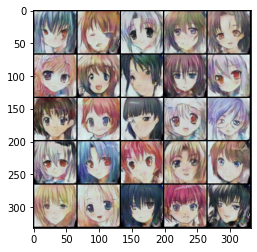

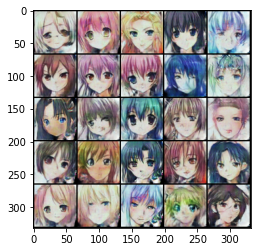

In [35]:
trainer.fit(model, dl)